In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from cartopy import crs
from statsmodels.tools import add_constant

In [1]:
from fs.sshfs import SSHFS
sshfs = SSHFS('localhost', 'arno', port=9000)
ds1 = xr.open_dataset(sshfs.openbin('/home/arno/Documents/data/SST/sst.wkmean.1981-1989.nc'))
ds2 = xr.open_dataset(sshfs.openbin('/home/arno/Documents/data/SST/sst.wkmean.1990-present.nc'))

In [2]:
%matplotlib nbagg

In [45]:
from IPython.display import set_matplotlib_formats
%matplotlib inline

set_matplotlib_formats('png', 'pdf')

In [3]:
ds1 = xr.open_dataset('../../../data/SST/sst.wkmean.1981-1989.nc')

In [4]:
ds2 = xr.open_dataset('../../../data/SST/sst.wkmean.1990-present.nc')

In [109]:
land = xr.open_dataarray('../../../data/SST/lsmask.nc').where(land==1).squeeze()

**NOTE:** The two parts of the Reynolds weekly datasets start each week on different weekdays (the two parts are provided like this on all the different web services). 

In [91]:
pd.Index(ds2.time_bnds[0].values.astype('timedelta64[D]') + np.datetime64('1800')).weekday_name

Index(['Sunday', 'Sunday'], dtype='object')

In [90]:
pd.Index(ds1.time_bnds[-1].values.astype('timedelta64[D]') + np.datetime64('1800')).weekday_name

Index(['Thursday', 'Thursday'], dtype='object')

In [5]:
sst = xr.concat((ds1, ds2), 'time')

In [7]:
ep = xr.open_dataset('/nfs/sata1_glacio/glacio/Reanalysis/ERA-EvaPpt-dailysum.nc')

In [8]:
ppt = ep['var228'] + ep['var182']

In [9]:
lon, lat = [-(79 + 31/60 + 31.8/3600), -(84 + 8/60 + 56.3/3600)]

In [124]:
i = ppt.indexes['lon'].get_loc(lon+360, 'nearest')
j = ppt.indexes['lat'].get_loc(lat, 'nearest')

In [94]:
p_thu = ppt[:, j, i].resample(time='W-THU', closed='left', label='left').sum('time')
p_sun = ppt[:, j, i].resample(time='W-SUN', closed='left', label='left').sum('time')

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)
/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)


In [125]:
a, b = xr.align(p_thu, sst['sst'], exclude=['lon', 'lat'])
c, d = xr.align(p_sun, sst['sst'], exclude=['lon', 'lat'])

In [141]:
# regression

X = add_constant(np.r_[a, c].reshape((-1, 1)))
Y = xr.concat((b, d), 'time').stack(space=('lat', 'lon'))

lsq = np.linalg.lstsq(X, Y)
reg = xr.DataArray(lsq[0][1], coords=[('space', Y.indexes['space'])]).unstack('space')

In [142]:
# correlation

y = Y.isel(space=Y.std('time')!=0)
co = np.empty(y.shape[1])
for k in range(y.shape[1]):
    co[k] = np.corrcoef(X[:, 1], y[:, k])[0, 1]
corr = xr.DataArray(co, coords=[('space', y.indexes['space'])]).unstack('space')

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


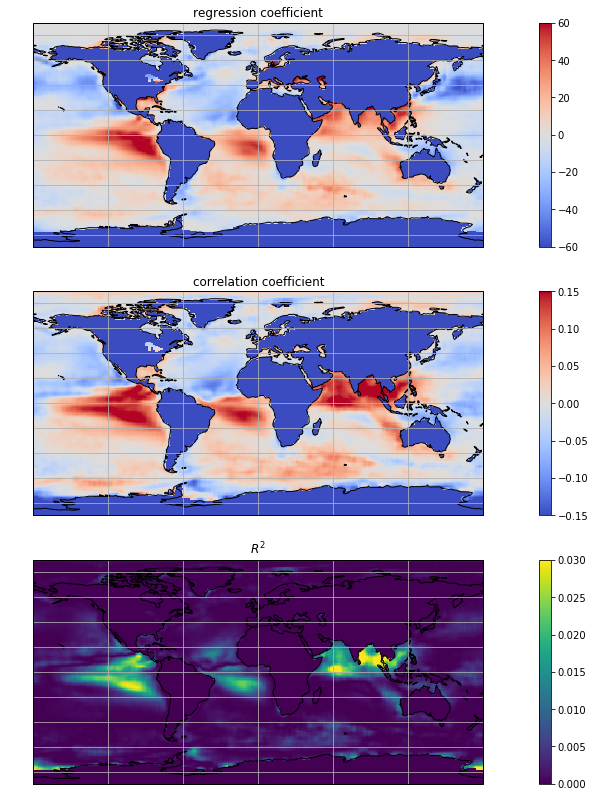

In [149]:
fig, axs = plt.subplots(3, 1, figsize=(12, 14), subplot_kw={'projection': crs.PlateCarree()})
fig.subplots_adjust(hspace=0.2)
plt.set_cmap('coolwarm')

ax = axs[0]
ax.set_title('regression coefficient')
pl = ax.pcolormesh(reg.lon, reg.lat, land * reg, vmin=-60, vmax=60)
plt.colorbar(pl, ax=ax)
ax.coastlines()
ax.gridlines()

ax = axs[1]
ax.set_title('correlation coefficient')
pl = ax.pcolormesh(corr.lon, corr.lat, land * corr, vmin=-0.15, vmax=0.15)
plt.colorbar(pl, ax=ax)
ax.coastlines()
ax.gridlines()

plt.set_cmap('viridis')
ax = axs[2]
ax.set_title('$R^2$')
pl = ax.pcolormesh(corr.lon, corr.lat, land * corr**2, vmin=0, vmax=0.03)
plt.colorbar(pl, ax=ax)
ax.coastlines()
ax.gridlines();

For weekly sums of precipitation minus evaporation at the SCH-1 location in ERA-Interim (just one gridpoint closest to the location). Regression is SST onto P-E; $R^2$ is from the correlation coefficient.

In [130]:
ay = a.resample(time='A').sum('time')
by = b.resample(time='A').mean('time')
cy = c.resample(time='A').sum('time')
dy = d.resample(time='A').mean('time')

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)
/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)
/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)
/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)


In [131]:
# regression

X = add_constant(np.r_[ay, cy].reshape((-1, 1)))
Y = xr.concat((by, dy), 'time').stack(space=('lat', 'lon'))

lsq = np.linalg.lstsq(X, Y)
reg = xr.DataArray(lsq[0][1], coords=[('space', Y.indexes['space'])]).unstack('space')

# correlation

y = Y.isel(space=Y.std('time')!=0)
co = np.empty(y.shape[1])
for k in range(y.shape[1]):
    co[k] = np.corrcoef(X[:, 1], y[:, k])[0, 1]
corr = xr.DataArray(co, coords=[('space', y.indexes['space'])]).unstack('space')

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


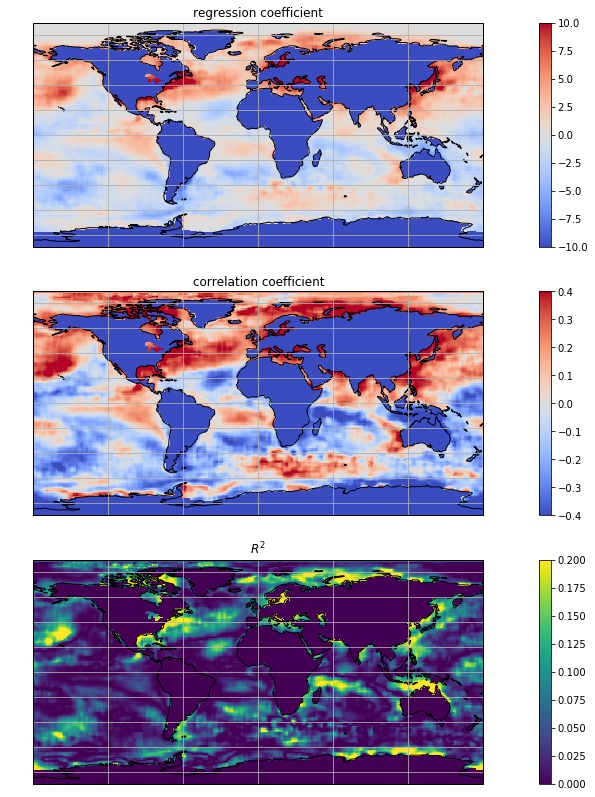

In [140]:
fig, axs = plt.subplots(3, 1, figsize=(12, 14), subplot_kw={'projection': crs.PlateCarree()})
fig.subplots_adjust(hspace=0.2)
plt.set_cmap('coolwarm')

ax = axs[0]
ax.set_title('regression coefficient')
pl = ax.pcolormesh(reg.lon, reg.lat, land * reg, vmin=-10, vmax=10)
plt.colorbar(pl, ax=ax)
ax.coastlines()
ax.gridlines()

ax = axs[1]
ax.set_title('correlation coefficient')
pl = ax.pcolormesh(corr.lon, corr.lat, land * corr, vmin=-0.4, vmax=0.4)
plt.colorbar(pl, ax=ax)
ax.coastlines()
ax.gridlines()

plt.set_cmap('viridis')
ax = axs[2]
ax.set_title('$R^2$')
pl = ax.pcolormesh(corr.lon, corr.lat, land * corr**2, vmin=0, vmax=0.2)
plt.colorbar(pl, ax=ax)
ax.coastlines()
ax.gridlines();

Same as above, but for yearly sums (P-E) / averages (SST).